# Question 1
Given Taylor Macoll equation is a second order ODE:
$$
\frac{\gamma - 1}{2}[1-V_r'-(\frac{dV_r'}{d\theta})^2]*[2V_r'+(\frac{dV_r'}{d\theta})cot\theta + (\frac{d^2V_r'}{d\theta^2})] - (\frac{dV_r'}{d\theta})*[V_r'(\frac{dV_r'}{d\theta})+(\frac{dV_r'}{d\theta})(\frac{d^2V_r'}{d\theta^2})]=0
$$
where $V'=\frac{V}{V_{max}}$  and $V_\theta = \frac{dV_r}{d\theta}$.\
Let us represent it as two 1st order ODE's.
$$y=
\begin{bmatrix}
y_1\\
y_2
\end{bmatrix}
=\begin{bmatrix}
V_r\\
V_\theta
\end{bmatrix}
$$

$$\frac{d}{d\theta}
\begin{bmatrix}
y_1\\
y_2
\end{bmatrix}
=\begin{bmatrix}
y_2\\
\frac{y_1 y_2^2 - \frac{\gamma-1}{2}(1 - y_1^2 - y_2^2)(2y_1 + y_2 \cot(\theta_s))}{\frac{\gamma-1}{2}(1 - y_1^2 - y_2^2) - y_2^2}
\end{bmatrix}
\tag{eq:1}
$$

### Numerical Procedure:
- For a particular cone angle calculate the equivalent wedge angle shock using oblique shock relation ($\theta-\beta-M$ relation). 
- Using this as $\theta_s$ as initial approximation and given Mach ,calculate Mach number($M_2$) and flow deflection($\delta$) angle behind the shock using oblique shock relations.
- Using this $M_2$ calcualte V' using formula
  $$\frac{V}{V_{max}}=V'=[\frac{2}{(\gamma-1)M^2}+1]^{-1/2}\tag{2}$$
- $V_r'$ and $V_\theta'$ are calculated from geometry i.e $V_r' = V'cos(\theta_s-\delta),V_\theta' = -V'sin(\theta_s-\delta)$
   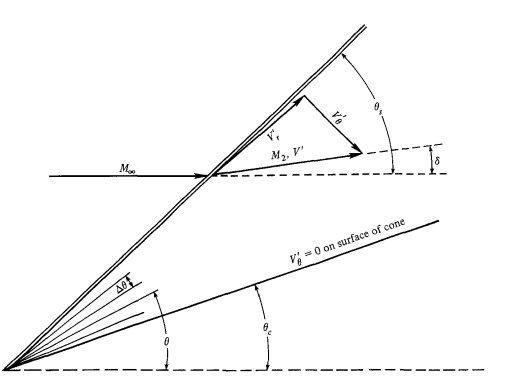
- Considering  $V_r'$ and $V_\theta'$ as initial approximation solve the **eq(1)** numerically in steps of $\theta_s$ marching away from shock till the deflection angle as it is clear from concept that cone angle is going to be in between the equivalent wedge shock angle and wedge angle. So I solved the the ODE with rungekutta for all the $\theta_s$ values and for each $\theta_s$ $V_r'$ and $V_\theta'$ are calculated.
- At some value of $\theta_s$ we will find $\theta_c$(**cone angle**) where $V_\theta'=0$, I have found this value by finding the minimum of all calculated values of $\theta$ between $\theta_s$ and $\delta$ as the value never equals 0 but it will be in order of 1e-2 to 1e-7.
- If this $\theta_c$ matches the given cone angle then that respective shock angle $\theta_s$ is our shock angle fo the given cone angle.
- If cone angle is not equal to given angle then folow the same procedure for steps of cone angle which is manually adjusted based on the error $\theta_c-given_cone$ until it reaches the tolerance level of 1e-2.
- The value of $V_r'$ at $\theta_c$ is used to calculate the Mach at that cone angle using **(eq2)**.
- In the process of calculating cone angle whole velocity flow field between the shock and cone angle is obtained i.e can be extracted from Runge kutta marching away from shock till the cone angle.
- Then pressure can be calculated using isentropic relations and oblique relations as floe behind the shock is Isentropic not at the shock.
  $$\frac{P_c}{P_\infty}=\frac{\frac{P_{02}}{P_2}*\frac{P_2}{P_\infty}}{\frac{P_{02}}{P_c}}$$
**Follow this whole procedure for Mach 2,4,6 and cone angle between 5 to 40.**\
**I have used "[Compressible Aerodynamics calculator](https://devenport.aoe.vt.edu/aoe3114/calc.html) to verify my result and "[Modern compressible flow by Anderson] to verify my graph"**

  


In [2]:
import numpy as np
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize 

def wedge_shock_angle(shock_angle,def_angle):
    shock_angle_rad = np.radians(shock_angle)
    lhs = np.tan(np.radians(def_angle))
    rhs = (2 * (1/np.tan(shock_angle_rad))*((((M**2)*((np.sin((shock_angle_rad))**2)))-1) / ((M**2 * (gamma+np.cos(2*(shock_angle_rad)))) + 2)) )
    return lhs - rhs

def taylor_macoll(theta,y,gamma):
    y1,y2 = y
    k=(gamma-1)/2
    num = ((y2**2)*y1) - k*(1-(y1**2)-(y2**2))*((2*y1)+(y2*(1/np.tan(theta))))
    den =(k*(1-(y1**2)-(y2**2)))-(y2**2) 
    return np.array([y2 , num/den ])
    
def rk4(f,y0,theta0,h):
   y=y0
   theta=theta0[0]
   N=len(theta0)
   y_values=[]
   theta_values=[]
   for i in range(1,N):
       k1 = h*f(theta, y,gamma)
       k2 = h*f(theta + 0.5 * h, y + 0.5 * k1 ,gamma)
       k3 = h*f(theta + 0.5 * h, y + 0.5 * k2 ,gamma)
       k4 = h*f(theta + h, y + k3 ,gamma)
    
       y = y + (k1 + 2*k2 + 2*k3 + k4)/6
       theta = theta + h
       theta_values.append(theta)
       y_values.append(y)
     
   return np.array(y_values),np.array(theta_values)

def calculate_cone_angle(theta_s,M,gamma):
    
    mach_angle=np.rad2deg(np.arcsin(1/M)) 
    
    #wedge angle using oblique shock relation
    if np.degrees(theta_s) > mach_angle or np.isclose(np.degrees(theta_s),mach_angle):   
        tan_beta = (2 * (1/np.tan(theta_s))*((((M**2)*((np.sin((theta_s))**2)))-1) / ((M**2 * (gamma+np.cos(2*(theta_s)))) + 2)) )
        beta=np.arctan(tan_beta) #deflection angle
        
        M1n=M*np.sin(theta_s)
        M2n = np.sqrt(((M1n**2 + 2/(gamma-1)) / (2*gamma/(gamma-1)*M1n**2 - 1)))
        M2 = M2n/np.sin(theta_s - beta)
        
        #Cone shock initial approx
        V_dash = ((2/((gamma-1)*(M2**2))) + 1)**(-0.5)
        
        Vr_dash = V_dash * np.cos(theta_s-beta)
        Vtheta_dash = -V_dash * np.sin(theta_s-beta)
        
        del_theta = -np.radians(0.001)
        theta = np.arange(theta_s, beta , del_theta)
        y0=np.array([Vr_dash , Vtheta_dash])
        
        #solving equation
        y_values,theta_values=rk4(taylor_macoll,y0,theta,del_theta)
        
        idx = np.argmin(np.abs(y_values[:, 1]))
        cone_angle = np.degrees(theta[idx])
        
    return cone_angle,theta_s,y_values,idx,M1n,M2,theta_values
        


Mach number : 2
Actual cone angle = 5.0, θs = 30.1001°, θc = 4.9983°
Actual cone angle = 6.0, θs = 30.1914°, θc = 6.0012°
Actual cone angle = 7.0, θs = 30.3450°, θc = 7.0008°
Actual cone angle = 8.0, θs = 30.5696°, θc = 7.9998°
Actual cone angle = 9.0, θs = 30.8528°, θc = 8.9911°
Actual cone angle = 10.0, θs = 31.2049°, θc = 10.0026°
Actual cone angle = 11.0, θs = 31.6339°, θc = 10.9982°
Actual cone angle = 12.0, θs = 32.1214°, θc = 11.9997°
Actual cone angle = 13.0, θs = 32.6652°, θc = 13.0079°
Actual cone angle = 14.0, θs = 33.2627°, θc = 13.9900°
Actual cone angle = 15.0, θs = 33.9131°, θc = 14.9904°
Actual cone angle = 16.0, θs = 34.6126°, θc = 15.9949°
Actual cone angle = 17.0, θs = 35.3561°, θc = 17.0098°
Actual cone angle = 18.0, θs = 36.1344°, θc = 18.0091°
Actual cone angle = 19.0, θs = 36.9514°, θc = 19.0101°
Actual cone angle = 20.0, θs = 37.7927°, θc = 19.9909°
Actual cone angle = 21.0, θs = 38.6830°, θc = 21.0067°
Actual cone angle = 22.0, θs = 39.5948°, θc = 21.9931°


/tmp/ipykernel_1139530/2143734546.py:13: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last five Jacobian evaluations.



Actual cone angle = 23.0, θs = 40.5421°, θc = 22.9934°


/tmp/ipykernel_1139530/2143734546.py:13: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.



Actual cone angle = 24.0, θs = 41.5188°, θc = 23.9921°
Actual cone angle = 25.0, θs = 42.5388°, θc = 25.0095°
Actual cone angle = 26.0, θs = 43.5808°, θc = 26.0095°
Actual cone angle = 27.0, θs = 44.6541°, θc = 27.0089°
Actual cone angle = 28.0, θs = 45.7630°, θc = 28.0098°
Actual cone angle = 29.0, θs = 46.8949°, θc = 28.9942°
Actual cone angle = 30.0, θs = 48.0771°, θc = 29.9943°
Actual cone angle = 31.0, θs = 49.3051°, θc = 31.0048°
Actual cone angle = 32.0, θs = 50.5685°, θc = 31.9928°
Actual cone angle = 33.0, θs = 51.9074°, θc = 33.0101°
Actual cone angle = 34.0, θs = 53.2945°, θc = 34.0092°
Actual cone angle = 35.0, θs = 54.7416°, θc = 34.9929°
Actual cone angle = 36.0, θs = 56.3200°, θc = 36.0097°
Actual cone angle = 37.0, θs = 58.0071°, θc = 37.0098°
Actual cone angle = 38.0, θs = 59.8812°, θc = 38.0100°
Actual cone angle = 39.0, θs = 62.0571°, θc = 39.0098°
Actual cone angle = 40.0, θs = 64.8355°, θc = 39.9897°
Mach number : 4
Actual cone angle = 5.0, θs = 14.9617°, θc = 4.99

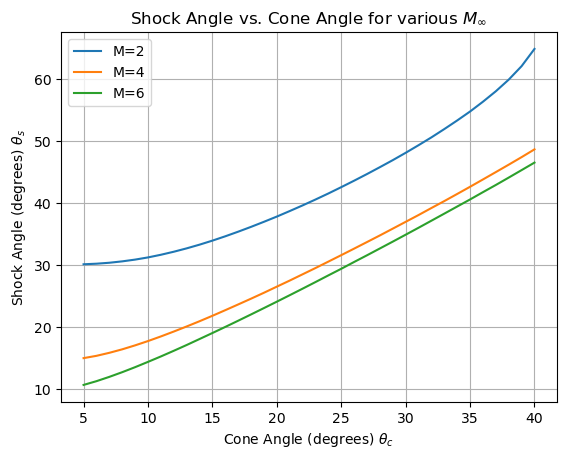

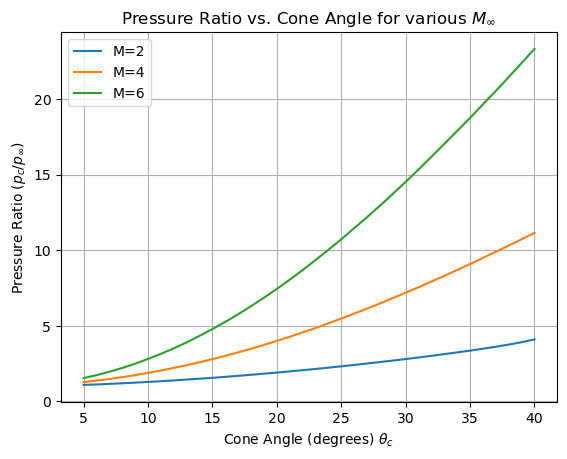

In [27]:
mach_val=np.array([2,4,6])
gamma=1.4
given_cone = np.linspace(5, 40, 36)
all_shock_angles = {}
all_pc_pinf_values = {}

for M in mach_val:
    shock_angles=[]
    pc_pinf_values=[]
    cone_angle=50
    print(f"\033[1mMach number : {M}\033[0m")
    for j in given_cone:
        wedge_shock = fsolve(wedge_shock_angle, 5 ,args=(j),xtol=1e-8)[0]
        theta_s=np.radians(wedge_shock)
        while not np.isclose(cone_angle,j,atol=1e-2):
             #cone shock angle in rad
            cone_angle,theta_s,y_values,idx,M1n,M2,theta_values=calculate_cone_angle(theta_s, M, gamma)
            # Multiple step sizes                 
            if (cone_angle-j) > 7:    
                del_shock = -0.07
            elif (cone_angle-j) > 2 and (cone_angle-j) < 7:    
                del_shock = -0.01
            elif (cone_angle-j) < 2 and (cone_angle-j) > 0.05:
                del_shock = -0.002
            elif (cone_angle-j) < 0:
                del_shock = 0.0001
            else:
                del_shock = -0.00003
            theta_s += del_shock
            
        print(f"Actual cone angle = {j}, θs = {np.rad2deg(theta_s):.4f}°, θc = {cone_angle:.4f}°")
    # "Properties behind shock"
        shock_angles.append(np.degrees(theta_s))
        act_Vr,act_Vt = y_values[idx]
        act_V = np.sqrt(act_Vr**2 + act_Vt**2)
        act_M = np.sqrt(2/((gamma-1)*((act_V ** (-2))-1)))
        
        p0_p2 = (1 + ((gamma-1)*(M2**2)*0.5))**(gamma/(gamma-1))
        p2_p1 = 1+ ((2*gamma*((M1n**2)-1))/(gamma+1))
        p0_pc = (1 + ((gamma-1)*(act_M**2)*0.5))**(gamma/(gamma-1))
        pc_pinf = (p0_p2*p2_p1)/p0_pc
        
        pc_pinf_values.append(pc_pinf)
        
    all_shock_angles[M] = shock_angles
    all_pc_pinf_values[M] = pc_pinf_values

# Plot 1: Shock Angle vs. Cone Angle for all M
plt.figure()
for M, angles in all_shock_angles.items():
    plt.plot(given_cone, angles, label=f'M={M}')

plt.xlabel("Cone Angle (degrees) $\\theta_c$")
plt.ylabel("Shock Angle (degrees) $\\theta_s$")
plt.title("Shock Angle vs. Cone Angle for various $M_\\infty$")
plt.grid(True)
plt.legend()

# Plot 2: Pressure Ratio vs. Cone Angle for all M
plt.figure()
for M, pressures in all_pc_pinf_values.items():
    plt.plot(given_cone, pressures, label=f'M={M}')

plt.xlabel("Cone Angle (degrees) $\\theta_c$")
plt.ylabel("Pressure Ratio ($p_c/p_\\infty$)")
plt.title("Pressure Ratio vs. Cone Angle for various $M_\\infty$")
plt.grid(True)
plt.legend()
plt.show()


### For a combination of Mach 4 and cone angle 20$\degree$ plot the pressure distribution and Mach number distribution in the flow.
We can see that Pressure ratio decreases as we move away from cone surface, and the Mach number increases as we move towards the shock.

next cone angle 20


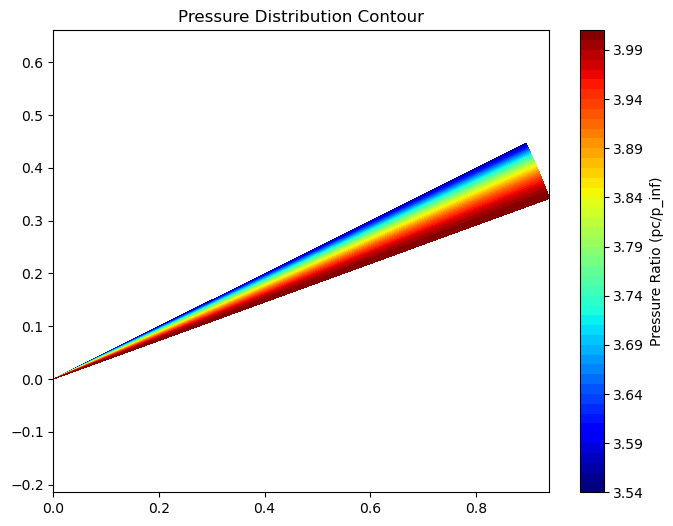

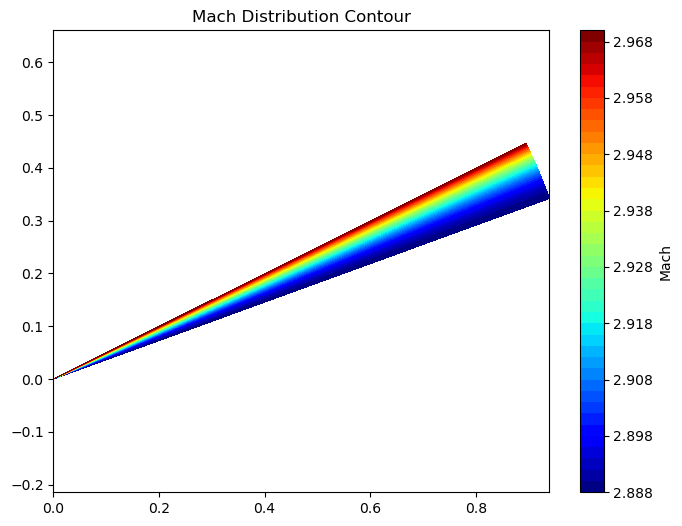

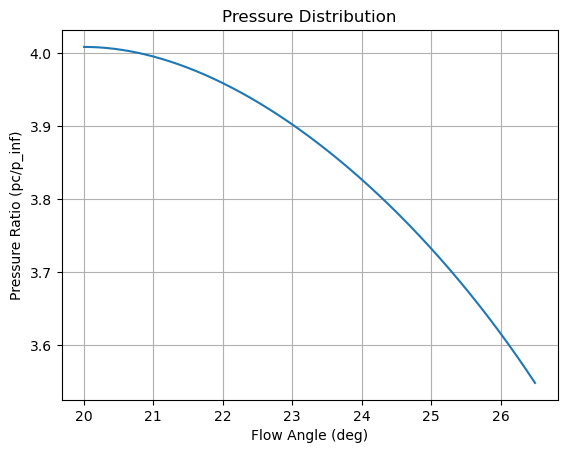

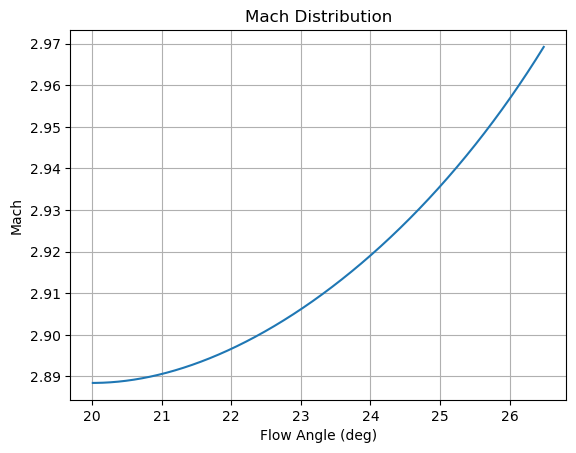

In [9]:
M=4
gamma=1.4
j=20
#given_cone = np.linspace(5, 40, 15)

cone_angle=50

wedge_shock = fsolve(wedge_shock_angle, 5 ,args=(j),xtol=1e-8)[0]
theta_s=np.radians(wedge_shock)

cone_angles=[]
pc_pinf_values=[]
mach_values=[]
print(f"next cone angle {j}")
while not np.isclose(cone_angle,j,atol=1e-2):
    
    cone_angle,theta_s,y_values,idx,M1n,M2,theta_values=calculate_cone_angle(theta_s, M, gamma)
    
    # Multiple step sizes to reach the value faster        
    if (cone_angle-j) > 7:    
        del_shock = -0.07
    elif (cone_angle-j) > 2 and (cone_angle-j) < 7:    
        del_shock = -0.01
    elif (cone_angle-j) < 2 and (cone_angle-j) > 0.05:
        del_shock = -0.002
    elif (cone_angle-j) < 0:
        del_shock = 0.0001
    else:
        del_shock = -0.00003
    theta_s += del_shock

# "Properties behind shock"
act_Vr,act_Vt = y_values[:,0] ,y_values[:,1]
act_V = np.sqrt(act_Vr**2 + act_Vt**2)
act_M = np.sqrt(2/((gamma-1)*((act_V ** (-2))-1)))

p0_p2 = (1 + ((gamma-1)*(M2**2)*0.5))**(gamma/(gamma-1))
p2_p1 = 1+ ((2*gamma*((M1n**2)-1))/(gamma+1))
p0_pc = (1 + ((gamma-1)*(act_M**2)*0.5))**(gamma/(gamma-1))
pc_pinf = (p0_p2*p2_p1)/p0_pc

final_theta_deg = np.degrees(theta_values)


# --- 2D contour plots ---
r = np.linspace(0, 1, 50)
theta = np.radians(final_theta_deg[:idx+1])
R, Theta = np.meshgrid(r, theta)

P = np.tile(pc_pinf[:idx+1], (r.size,1)).T
M = np.tile(act_M[:idx+1], (r.size,1)).T

X = R*np.cos(Theta)
Y = R*np.sin(Theta)

plt.figure(figsize=(8,6))
norm = Normalize(vmin=np.min(P), vmax=np.max(P))
plt.contourf(X, Y, P, levels=50, cmap="jet", norm=norm)
plt.colorbar(label="Pressure Ratio (pc/p_inf)")
plt.title("Pressure Distribution Contour")
plt.axis("equal")
plt.show()

plt.figure(figsize=(8,6))
norm = Normalize(vmin=np.min(M), vmax=np.max(M))
plt.contourf(X, Y, M, levels=50, cmap="jet", norm=norm)
plt.colorbar(label="Mach")
plt.title("Mach Distribution Contour")
plt.axis("equal")
plt.show()


plt.figure()
plt.plot(final_theta_deg[:idx+1], pc_pinf[:idx+1])
plt.grid(True)
plt.xlabel("Flow Angle (deg)")
plt.ylabel("Pressure Ratio (pc/p_inf)")
plt.title("Pressure Distribution")
plt.show()

plt.figure()
plt.plot(final_theta_deg[:idx+1], act_M[:idx+1])
plt.grid(True)
plt.xlabel("Flow Angle (deg)")
plt.ylabel("Mach")
plt.title("Mach Distribution")
plt.show()

# Question 2
### 1. Panel Geometry
The aircraft surface is discretized into small **quad panels** using the geometry from the `.wgs` file.  
Each quad is defined by four points:

$ p_1, \; p_2, \; p_3, \; p_4 $

Two diagonals are formed:

$ d_1 = p_3 - p_2, \quad d_2 = p_4 - p_1 $

The **normal vector** of the panel is obtained by:

$ \mathbf{n} = d_1 \times d_2 $

The panel **area** is:

$ A = \tfrac{1}{2} \, \|\mathbf{n}\| $

The normal is then normalized:

$ \hat{\mathbf{n}} = \frac{\mathbf{n}}{\|\mathbf{n}\|} $
### 2. Freestream Direction and Angle of Attack
The freestream direction is set as:

$ \mathbf{\hat{V}}_\infty = [\cos\alpha, \; 0, \; \sin\alpha] $

- At $\alpha = 0^\circ$, flow is purely along the $+X$-axis.  
- As $\alpha$ increases, the flow tilts upward in the $Z$-direction.

The **lift direction**, perpendicular to the freestream in the $XZ$-plane, is:

$ \mathbf{\hat{V}}_\perp = [\sin\alpha, \; 0, \; \cos\alpha] $
### 3. Panel Inclination and Pressure Coefficient
The inclination angle $\theta$ of each panel relative to the freestream is:

$ \sin\theta = -\mathbf{\hat{V}}_\infty \cdot \hat{\mathbf{n}}, 
\quad \theta = \arcsin(\sin\theta) $

Using **Newtonian sine-squared law**, the local pressure coefficient is:

$ 
C_{p,i} =
\begin{cases}
C_{p,\max} \, \sin^2\theta, & \theta > 0 \\
0, & \theta \leq 0
\end{cases}
$
#### Calculation of $C_{p,\max}$

$C_{p,\max}$ is the maximum pressure coefficient, it is computed from the ratio of the stagnation pressure behind a normal shock to the freestream static pressure.

$ C_{p,\max} = \dfrac{p_0 - p_\infty}{q_\infty} $

where $p_0$ is the appropriate stagnation pressure, $p_\infty$ is freestream static pressure, and $q_\infty = \tfrac{1}{2}\rho_\infty V_\infty^2$.

Using the relation :

$ C_{p,\max} = \dfrac{2\left(\dfrac{p_0}{p_\infty} - 1\right)}{\gamma M^2} $.


$ C_{p,\max} = \dfrac{2\left(\dfrac{p_{0,2}}{p_2}\cdot\dfrac{p_2}{p_1} - 1\right)}{\gamma M^2} $.

### 4. Panel Force Contribution
The pressure coefficient acts normal to the surface:

$ \mathbf{f}_i = C_{p,i} \, \hat{\mathbf{n}} \, A_i $

This quantity has the units of **area × dimensionless Cp**.  
It effectively represents the **force per dynamic pressure**:

$ \mathbf{f}_i = \frac{\mathbf{F}_i}{q_\infty} $
### 5. Lift and Drag
The contribution of each panel to lift and drag is obtained by projecting the panel force:

$ L = \sum_i \mathbf{f}_i \cdot \mathbf{\hat{V}}_\perp $

$ D = -\sum_i \mathbf{f}_i \cdot \mathbf{\hat{V}}_\infty $

### 6. Non-dimensionalization
To obtain aerodynamic coefficients, divide by the reference area $S_\text{ref}$:\
$ C_L = \frac{L}{S_\text{ref}}, 
\quad C_D = \frac{D}{S_\text{ref}} $


**Hover over the contour plot to know the variables at the centroid of each panel**


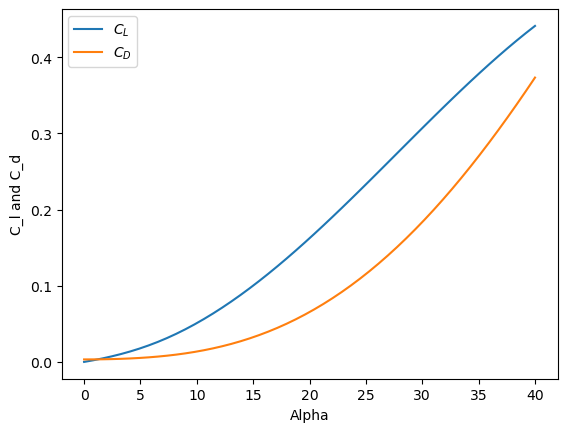

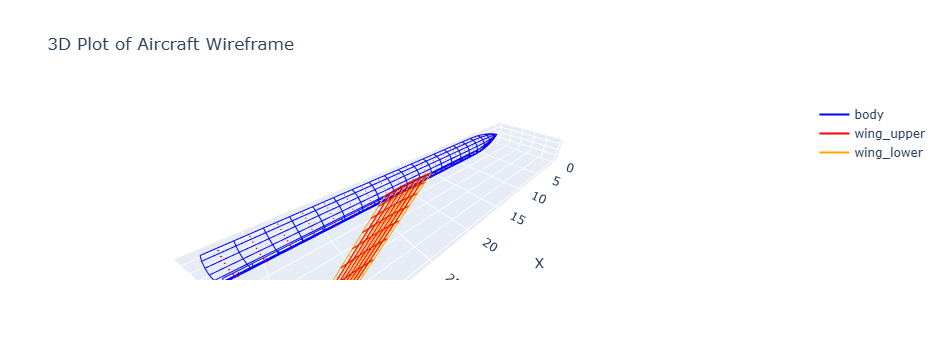

In [13]:
import numpy as np
import plotly.graph_objects as go

def parse_wgs_file(file_path):
    body_floats = []
    wing_upper_floats = []
    wing_lower_floats = []
    current_section = None
    
    with open(file_path, 'r') as file:
        for line in file:
            line = line.strip()
            
            # Identify section headers
            if line == "'BODY'":
                current_section = 'BODY'
                continue
            elif line == "'WING-UPPER'":
                current_section = 'WING-UPPER'
                continue
            elif line == "'WING-LOWER'":
                current_section = 'WING-LOWER'
                continue
            
            # Skip empty lines, metadata, or integer header lines
            if not line or line.startswith('Created') or (line.split() and line.split()[0].replace('-','').replace('+','').isdigit()):
                continue
            
            # Parse float data
            try:
                coords = [float(x) for x in line.split()]
                if current_section == 'BODY':
                    body_floats.extend(coords)
                elif current_section == 'WING-UPPER':
                    wing_upper_floats.extend(coords)
                elif current_section == 'WING-LOWER':
                    wing_lower_floats.extend(coords)
            except ValueError:
                continue
    
    # Convert to 1D numpy arrays
    body_array = np.array(body_floats)
    wing_upper_array = np.array(wing_upper_floats)
    wing_lower_array = np.array(wing_lower_floats)
    
    return body_array, wing_upper_array, wing_lower_array

def contour_plot(data_dict):
    fig = go.Figure()
    colors = {'body': 'blue', 'wing_upper': 'red', 'wing_lower': 'orange'}
    
    for name, data in data_dict.items():
        # Get the number of points per contour
        num_contours, n_pts, _ = data.shape
        color = colors.get(name.lower(), 'gray')
        
        # Plot the contour lines (cross-sections)
        for contour in data:
            fig.add_trace(go.Scatter3d(
                x=contour[:, 0],
                y=contour[:, 1],
                z=contour[:, 2],
                mode='lines',
                line=dict(color=color),
                name=name,
                showlegend=False 
            ))
        
        # Plot the longitudinal lines (connecting the contours)
        for i in range(n_pts):
            fig.add_trace(go.Scatter3d(
                x=data[:, i, 0],
                y=data[:, i, 1],
                z=data[:, i, 2],
                mode='lines',
                line=dict(color=color),
                name=name,
                showlegend=False
            ))
        fig.add_trace(go.Scatter3d(
            x=[None], y=[None], z=[None], 
            mode='lines', 
            name=name,
            line=dict(color=color)
        ))
    fig.update_layout(
        title='3D Plot of Aircraft Wireframe',
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        )
    )

    return fig

def p02_p1(M):
    gamma=1.4
    k=(gamma-1)/2
    M2=np.sqrt((1+(k*(M**2)))/(gamma*M**2-k))
    po2_p2=(1+(k*M2**2))**(gamma/(gamma-1))
    p2_p1=1+(((2*gamma)*((M**2)-1))/(gamma+1))
    value=(2*(po2_p2*p2_p1 - 1))/(gamma*M**2)
    return value

def normal_calc(body,a):
    alpha=a
    M=4.63
    cp_max=p02_p1(M)
    normals = []
    points = []
    Areas = []
    sin_values=[]
    cp_values=[]
    sin_theta_values=[]
    lift=0
    drag=0
    for c1 in range(body.shape[0]-1):   # loop over sections
        for i in range(n_pts-1):       # loop over contour points
            # quad vertices
            p1 = body[c1, i, :]
            p2 = body[c1, i+1, :]
            p3 = body[c1+1, i, :]
            p4 = body[c1+1, i+1, :]
    
            # diagonals of quad
            d1 = p3 - p2
            d2 = p4 - p1
    
            # normal vector
            normal = np.cross(d1, d2)
            area = 0.5*np.linalg.norm(normal)
            V_unit = np.array([np.cos(alpha),0,np.sin(alpha)])
            V_perp = np.array([np.sin(alpha),0,np.cos(alpha)])

            
            normal=normal/np.linalg.norm(normal)
            sin_theta = np.dot(-V_unit, normal)
            theta = np.degrees(np.arcsin(sin_theta))
            
            
            if theta<0 or theta==0:
                cp=0
            else:
                cp=cp_max*(np.sin(np.radians(theta))**2)
                
            cp = -cp * normal
            cp_force = cp * area
            lift += np.dot(cp_force,V_perp)
            drag += np.dot(cp_force,-V_unit)
            center = (p1 + p2 + p3 + p4) / 4.0
    
            normals.append(normal)
            points.append(center)
            Areas.append(area)
            sin_values.append(theta)
            cp_values.append(cp)
            sin_theta_values.append(sin_theta)

    Areas = np.array(Areas)
    normals = np.array(normals)
    points = np.array(points)
    sin_values = np.array(sin_values)
    cp_values = np.array(cp_values)
    sin_theta_values = np.array(sin_theta_values)
    # -------------------
    # Visualize normals (Cones)
    # -------------------
    fig.add_trace(go.Cone(
        x=points[:,0],
        y=points[:,1],
        z=points[:,2],
        u=normals[:,0],
        v=normals[:,1],
        w=normals[:,2],
        sizemode="absolute",
        sizeref=3,
        anchor = "tail",
        colorscale=[[0, 'red'], [1, 'red']],
        showscale=False,
        
        name="Normals",
        customdata=np.column_stack((normals, Areas,sin_values,cp_values,sin_theta_values,np.full_like(cp_values, np.degrees(a)))),  # attach normal + area
        hovertemplate=(
            "Normal: (%{customdata[0]:.3f}, %{customdata[1]:.3f}, %{customdata[2]:.3f})<br>"
            "Area:   (%{customdata[3]:.3f})<br>"
            "theta: (%{customdata[4]:.3f})<br>"
            "cp: (%{customdata[5]:.3f}, %{customdata[6]:.3f}, %{customdata[7]:.3f})<br>"
            "sin_theta: (%{customdata[8]:.3f})<br>"
            "Alpha: (%{customdata[9]:.3f})<br>")
    ))
    return normals,Areas,sin_values,cp_values,lift,drag

file_path = 'tmx1242.wgs'
body_data_flat, wing_upper_data_flat, wing_lower_data_flat = parse_wgs_file(file_path)

n_pts = 9   # number of contour points per section
body = body_data_flat.reshape(-1, n_pts, 3)
wing_upper= wing_upper_data_flat.reshape(-1, n_pts, 3)
wing_lower = wing_lower_data_flat.reshape(-1, n_pts, 3)

my_data = {    'body': body,
     'wing_upper': wing_upper,
     'wing_lower': wing_lower }

fig = contour_plot(my_data)
alpha=np.linspace(np.radians(0),np.radians(40),50)
#alpha=np.array([np.radians(0)])
lift_range=[]
drag_range=[]
for i in alpha:
    Normal_body,Area_body,sin_values_b,cp_values_b,lift_b,drag_b=normal_calc(body,i)
    Normal_upper,Area_upper,sin_values_wu,cp_values_wu,lift_wu,drag_wu=normal_calc(wing_upper,i)
    Normal_lower,Area_lower,sin_values_wl,cp_values_wl,lift_wl,drag_wl=normal_calc(wing_lower,i)
    S_ref=100 #given in Ppt
    lift=lift_b + lift_wu + lift_wl
    Cl = lift / S_ref
    
    drag=-(drag_b+drag_wu+drag_wl)
    Cd = drag / S_ref
    drag_range.append(Cd)
    lift_range.append(Cl)

import matplotlib.pyplot as plt
plt.plot(np.degrees(alpha),lift_range,label="$C_L$")
plt.plot(np.degrees(alpha),drag_range,label="$C_D$")
plt.xlabel("Alpha")
plt.ylabel("C_l and C_d")
plt.legend()
plt.show()

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    )
)
fig.show()